# Trabajo Práctico Final - Diplomatura de Deep Learning
# Style Transfer

<img src="https://i0.wp.com/chelseatroy.com/wp-content/uploads/2018/12/neural_style_transfer.png?resize=768%2C311&ssl=1">

La idea de este trabajo final es reproducir el siguiente paper:

https://arxiv.org/pdf/1508.06576.pdf

El objetivo es transferir el estilo de una imagen dada a otra imagen distinta. 

Como hemos visto en clase, las primeras capas de una red convolucional se activan ante la presencia de ciertos patrones vinculados a detalles muy pequeños.

A medida que avanzamos en las distintas capas de una red neuronal convolucional, los filtros se van activando a medida que detectan patrones de formas cada vez mas complejos.

Lo que propone este paper es asignarle a la activación de las primeras capas de una red neuronal convolucional (por ejemplo VGG19) la definición del estilo y a la activación de las últimas capas de la red neuronal convolucional, la definición del contenido.

La idea de este paper es, a partir de dos imágenes (una que aporte el estilo y otra que aporte el contenido) analizar cómo es la activación de las primeras capas para la imagen que aporta el estilo y cómo es la activación de las últimas capas de la red convolucional para la imagen que aporta el contenido. A partir de esto se intentará sintetizar una imagen que active los filtros de las primeras capas que se activaron con la imagen que aporta el estilo y los filtros de las últimas capas que se activaron con la imagen que aporta el contenido.

A este procedimiento se lo denomina neural style transfer.

# En este trabajo se deberá leer el paper mencionado y en base a ello, entender la implementación que se muestra a continuación y contestar preguntas sobre la misma.

# Una metodología posible es hacer una lectura rápida del paper (aunque esto signifique no entender algunos detalles del mismo) y luego ir analizando el código y respondiendo las preguntas. A medida que se planteen las preguntas, volviendo a leer secciones específicas del paper terminará de entender los detalles que pudieran haber quedado pendientes.

Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte el contenido. A tal fin utilizaremos imágenes disponibles en la web.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Imagen para estilo
!wget https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg

# Imagen para estilo elegida por mi
!wget https://commons.wikimedia.org/wiki/File:The_Scream_by_Edvard_Munch,_1893_-_Nasjonalgalleriet.png

# Imagen para contenido
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg

# Creamos el directorio para los archivos de salida
!mkdir /content/output

--2020-11-15 14:19:20--  https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 223725 (218K) [image/jpeg]
Saving to: ‘La_noche_estrellada1.jpg’

La_noche_estrellada 100%[===================>] 218.48K   364KB/s    in 0.6s    

2020-11-15 14:19:21 (364 KB/s) - ‘La_noche_estrellada1.jpg’ saved [223725/223725]

--2020-11-15 14:19:21--  https://commons.wikimedia.org/wiki/File:The_Scream_by_Edvard_Munch,_1893_-_Nasjonalgalleriet.png
Resolving commons.wikimedia.org (commons.wikimedia.org)... 103.102.166.224, 2001:df2:e500:ed1a::1
Connecting to commons.wikimedia.org (commons.wikimedia.org)|103.102.166.224|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 89901 (88K) [text/html]
Saving to: ‘File:The_Scream_

In [ ]:
from keras.preprocessing.image import load_img, save_img, img_to_array
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse

from keras.applications import vgg19
from keras import backend as K
from pathlib import Path

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
# Definimos las imagenes que vamos a utilizar, y el directorio de salida

base_image_path = Path("/content/775px-Neckarfront_Tübingen_Mai_2017.jpg")
style_reference_image_path = Path("/content/La_noche_estrellada1.jpg")
#base_image_path = Path("/content/drive/My Drive/ITBA - Diplomatura DL - Trabajo Final/imagenes_propias/central_park.jpg")
#style_reference_image_path = Path("/content/drive/My Drive/ITBA - Diplomatura DL - Trabajo Final/imagenes_propias/The_Scream_by_Edvard_Munch.jpg")
result_prefix = Path("/content/output")
iterations = 100

# 1) En base a lo visto en el paper ¿Qué significan los parámetros definidos en la siguiente celda?

Respuesta: Los parámetros 'style_weight' y 'content_weight' en el paper son mencionados como β y α respectivamente, y hacen referencia a los ponderadores o los pesos que se le asignan a cada función de pérdida (función de pérdida o costo de 'contenido' y función de costo de 'estilo'). Luego, el parámetro 'total_variation_weight' corresponde al peso que se le dará al componente de regularización que se introduce en la función de pérdida total. El componente de regularización ayudará a que reducir el ruido de la imagen sintetizada (se explica mejor más adelante). 


In [ ]:
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

In [ ]:
# Definimos el tamaño de las imágenes a utilizar
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

# 2) Explicar qué hace la siguiente celda. En especial las últimas dos líneas de la función antes del return. ¿Por qué?

Ayuda: https://keras.io/applications/

Respuesta: La siguiente función sirve para preprocesar las imágenes de modo que puedan ser utilizadas como input de la VGG19. En primer lugar, se carga la imagen utilizando el *image_path* y convirtiendola a un tamaño target igual a *img_nrows* **x** *img_ncols*. Luego, se transforma la imagen en un numpy array y, a su vez, se le agregan los canales (la función *img_to_array* agrega los canales de manera que el shape resultante del numpy array es (img_nrows, img_ncols, channels)).
A continuación, la función *expand_dims* es utilizada para agregar el batch size a las dimensiones, de manera que el shape resultante es (1, img_nrows, img_ncols, channels). Por último, la función *vgg19.preprocess_input* sustrae la media de los canales RGB del dataset. Esto es porque el modelo VGG19 ha sido entrenado en un dataset diferente, pero el shape de la imagen sigue siendo (1, img_nrows, img_ncols, channels).
La documentación de esta última función explica que las imagenes son transformadas de RGB a BGR, de manera que cada canal de color está centrado en cero con respecto al dataset ImageNet, sin hacer scaling.

In [ ]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

# 3) Habiendo comprendido lo que hace la celda anterior, explique de manera muy concisa qué hace la siguiente celda. ¿Qué relación tiene con la celda anterior?

Respuesta: La función *deprocess_image* simplemente hace el camino inverso a la función *preprocess_image*. Primero hace un reshape de x, para que solo tenga altura, ancho y canales. Luego descentraliza los canales sumandoles la media, y por último invierte el orden de los canales para pasar de BGR a RGB.

In [ ]:
def deprocess_image(x):
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [ ]:
# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para 
base_image = K.variable(preprocess_image(base_image_path))
style_reference_image = K.variable(preprocess_image(style_reference_image_path))

In [ ]:
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

Aclaración:

La siguiente celda sirve para procesar las tres imagenes (contenido, estilo y salida) en un solo batch.

In [ ]:
# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

In [ ]:
# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

80142336/80134624 [==============================] - 1s 0us/step
Model loaded.


# 4) En la siguientes celdas:

- ¿Qué es la matriz de Gram?¿Para qué se usa?
- ¿Por qué se permutan las dimensiones de x?

Respuesta: La matriz de Gram (i,j) es una matriz que contiene las correlaciones entre los mapas de activación de los canales *i* y *j*, para una capa determinada *l*. Se utiliza para definir o representar el *estilo* de una imagen, es decir que el estilo se define como la correlación entre los mapas de activación de todos los canales (se computa Gram para cada par (*i*, *j*)).
Debido a que la matriz de Gram computa la correlación entre los mapas de activación de todos los canales, su tamaño resultante deberá ser nC x nC (nC = # canales), donde la celda (i=1,j=2) corresponderá a la correlación entre los filtros del primer canal y el segundo canal. Es por esto que se permutan las dimensiones de x, para que la altura de la matriz *features* sea nC y el ancho de la transpuesta sea nC (de manera que el producto punto sea de dimension nC x nC)

In [ ]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# 5) Losses:

Explicar qué mide cada una de las losses en las siguientes tres celdas.

Respuesta: Primero se define la *style_loss* a partir de pasarle como input los mapas de activación de una capa determinada *l* correspondientes a la "style image" (imagen de obra de arte de donde se obtendrá el estilo) y a la imagen sintetizada (*combination*). Dentro de esta  función se computan las matrices de Gram de todos los filtros de la "style image" y luego de la combinación, para luego calcular la "distancia" entre estas matrices (restandolas entre sí, tomando raiz y luego normalizando por **4 x nC^2 x (nH x nW)^2** ). De esta manera, para la capa *l* se define la función de pérdida del estilo *Jstyle* que se menciona en el paper. La función de pérdida del contenido *Jcontent* se calcula en *content_loss*, y directamente computa el error cuadrático entre los mapas de activación de la imagen sintetizada y la *content image* o base, para cada canal (luego se suma la diferencia cuadrática de todos los canales). Por último, tenemos la función *total_variation_loss* que calcula la suma de las diferencias absolutas para los valores de píxeles vecinos en la imagen de entrada. De esta forma, mide cuánto ruido hay en la imagen. Al incluir este componente en la función de pérdida total, imponemos una continuidad espacial local entre los píxeles de la imagen combinada, dándole coherencia visual.
De forma intuitiva, se puede decir que *Jstyle* mide de alguna forma la similitud entre la imagen artística y la imagen sintetizada, mientras que *Jcontent* mide cuán similares son la imagen original de contenido con respecto a la imagen sintetizada.

In [ ]:
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return K.sum(K.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [ ]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))


In [ ]:
def total_variation_loss(x):
    assert K.ndim(x) == 4
    a = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))


In [ ]:
# Armamos la loss total
loss = K.variable(0.0)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :] 
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

In [ ]:
grads = K.gradients(loss, combination_image)

outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

# 6) Explique el propósito de las siguientes tres celdas. ¿Qué hace la función fmin_l_bfgs_b? ¿En qué se diferencia con la implementación del paper? ¿Se puede utilizar alguna alternativa?

Respuesta: Revisando las funciones debajo, puedo concluir que la primera función (*eval_loss_and_grads*) sirve para calcular, a partir de lo declarado en la celda anterior, las losses y los gradientes, pero reportarlos de manera separada. Luego se crea una clase llamada Evaluator, que hace uso de *eval_loss_and_grads* para luego instanciar el objeto y poder reportar separadamente la loss y los gradientes, aunque estos se computen juntos (debido a que es más eficiente). A continuación, se procede implementar el modelo a partir de iteraciones, utilizando como optimizador el algoritmo L-BFGS (a diferencia del paper, en el cual usan Gradient Descent - SGD). A diferencia de algoritmos de optimización como Adam, SGD, Adagrad, Adadelta, etc que se centran en minimizar la función de costo utilizando el gradiente (método de 'primer orden'), L-BFGS es un método de 'segundo orden', dado que busca minimizar la función de costo a partir de la utilización de la segunda derivada o Hessiano. No obstante, como el Hessiano es costoso de computar, L-BFGS usa una aproximación del Hessiano. En varias implementaciones de Neural Style Transfer, suele encontrarse que L-BFGS performa un poco mejor que Adam, convergiendo a niveles menores de *loss*. A su vez, L-BFGS performa mejor para problemas con mayor cantidad de parámetros. Sin embargo, Adam es menos costoso de implementar computacionalmente, por lo cual puede que corra más rápido. Claramente entonces la alternativa es utilizar Adam o algún otro optimizador de primer orden, teniendo en cuenta Adam, Adagrad y L-BFGS son los que mejor performan al aumentar las iteraciones.

In [ ]:
def eval_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values

# this Evaluator class makes it possible
# to compute loss and gradients in one pass
# while retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# requires separate functions for loss and gradients,
# but computing them separately would be inefficient.

In [ ]:
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# 7) Ejecute la siguiente celda y observe las imágenes de salida en cada iteración.

Puede verse que a medida que se avanza en las iteraciones, la imagen obtenida es una mejor combinación entre la imagen de contenido (content image) y la imagen artística. Esto se debe a que a mayor cantidad de iteraciones, se está optimizando mejor y se llega a un nivel más bajo de loss, logrando más precisión en la imagen sintetizada.

In [ ]:
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)

for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    fname = result_prefix / ('output_at_iteration_%d.png' % i)
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))

Start of iteration 0
Current loss value: 13242354000.0
Image saved as /content/output/output_at_iteration_0.png
Iteration 0 completed in 23s
Start of iteration 1
Current loss value: 6212644400.0
Image saved as /content/output/output_at_iteration_1.png
Iteration 1 completed in 13s
Start of iteration 2
Current loss value: 4387811000.0
Image saved as /content/output/output_at_iteration_2.png
Iteration 2 completed in 13s
Start of iteration 3
Current loss value: 3508744200.0
Image saved as /content/output/output_at_iteration_3.png
Iteration 3 completed in 13s
Start of iteration 4
Current loss value: 2862069800.0
Image saved as /content/output/output_at_iteration_4.png
Iteration 4 completed in 13s
Start of iteration 5
Current loss value: 2433933600.0
Image saved as /content/output/output_at_iteration_5.png
Iteration 5 completed in 13s
Start of iteration 6
Current loss value: 2165312000.0
Image saved as /content/output/output_at_iteration_6.png
Iteration 6 completed in 13s
Start of iteration 

# 8) Generar imágenes para distintas combinaciones de pesos de las losses. Explicar las diferencias. (Adjuntar las imágenes generadas como archivos separados.)

Respuesta: Para poder observar cómo cambiaba el output ante cambios en los pesos, primero decidí probar qué ocurría al cambiar los pesos de manera que el ratio α/β, replicando la Figura 3 del paper (sin cambiar el peso correspondiente al componente de *total variation*). A partir de las imagenes generadas, las reuní a todas en una misma imagen para poder observar claramente las diferencias:



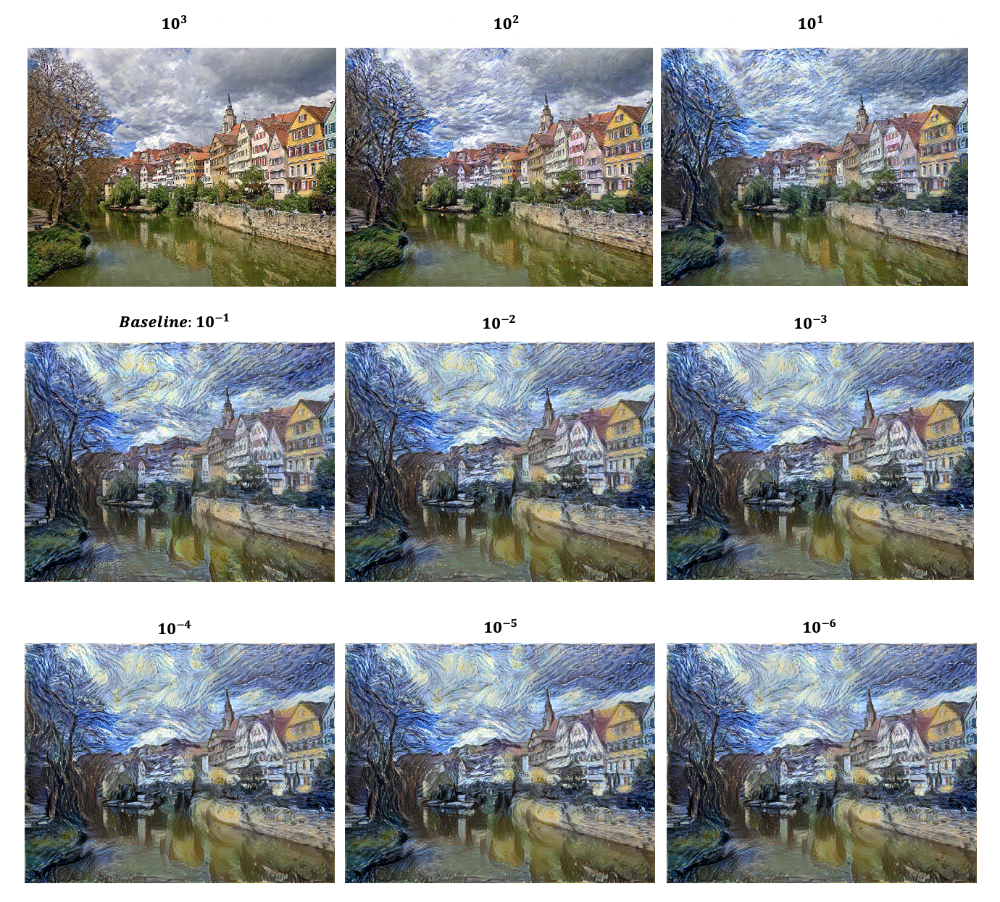

Puede observarse que hay una imagen que corresponde al modelo **baseline** que es aquel que se ejecutó en un principio con α=1 y β=10 (content_weight y style_weight respectivamente). Al aumentar el α con respecto al baseline, el peso que se le da a la imagen contenido es mayor, por ende el modelo se centrará en minimizar las diferencias entre la imagen generada y la imagen contenido. Es por esto que las imagenes generadas con un α mayor, se parecen más a la imagen contenido, teniendo pocos componentes de estilo. Luego, al aumentar el β, la imagen generada va teniendo mayores componentes de la imagen de estilo, observandose notoriamente en el cielo y en los reflejos en el lago. Esto tiene una explicación inversa a la anterior, ya que esta vez, al ser el β mayor, el modelo se centrá más en minimizar las diferencias entre la imagen generada y la imagen de estilo, por ende cuando más grande sea β, más similitud habrá con la imagen de estilo. Todas las imagenes sintetizadas con los distintos ratios α/β fueron guardadas en la carpeta '*imagenes_generadas_pesos*'.
<br>
<br>
Si mantenemos el ratio α/β como en el caso baseline, pero cambiamos el peso asignado al componente de *total variation* podemos observar lo siguiente:



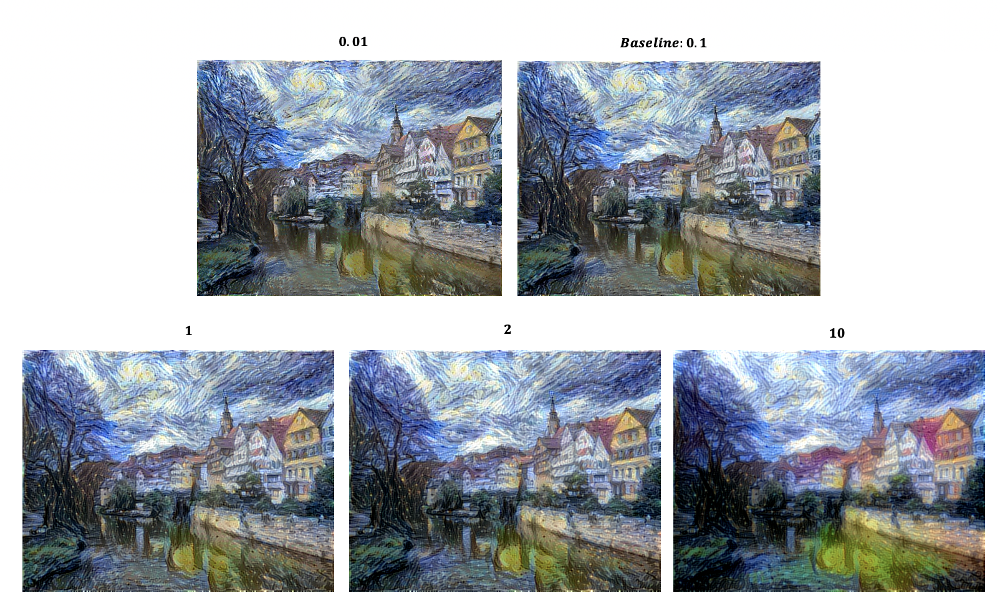

He corrido el modelo con un valor de *total_variation_weight* igual a 0.01, 1, 2, 10. Lo que puede notarse a simple vista es el efecto de "difuminación" que existe a medida que aumenta la participación de la variación total en la función de costo. Recordemos que la variación total es la suma de las diferencias absolutas entre los pixels vecinos, por lo que de alguna forma mide el ruido que hay en la imagen. A mayor ruido, más "tosca" va a ser la imagen generada, notandose más fuertemente que está sintetizada. Al darle más importante a la variación total en la función de costo, busca minimizarse ese ruido, generando una imagen más suave, con más continuidad entre los pixeles. Se ve claramente como a medida que se aumenta el *total_variation_weight*, la imagen sintetizada parece más una obra de arte única, y no producto de la unión de dos imagenes, con mayor suavidad y coherencia visual. Por supuesto, en el extremo (*total_variation_weight* muy alto), la imagen parece muy difuminada, siendo poco notorios algunos detalles característicos de la imagen contenido. Todas las imagenes sintetizadas con los distintos valores del *total_variation_weight* pueden encontrarse en la carpeta '*imagenes_generadas_pesos*'. 

# 9) Cambiar las imágenes de contenido y estilo por unas elegidas por usted. Adjuntar el resultado.

Respuesta: Decidí utilizar como imagen contenido, una foto sacada por mí misma en mi último viaje a Nueva York, en el Central Park. Como imagen de estilo, elegí un clásico del arte: El Grito de Edvard Munch. Luego de ir probando con distintos pesos, me decidi por un α=10 y β=40, con peso de variación total igual a 0.1 (como en el caso baseline). Todas estas imagenes pueden encontrarse en la carpeta '*imagenes propias*'.

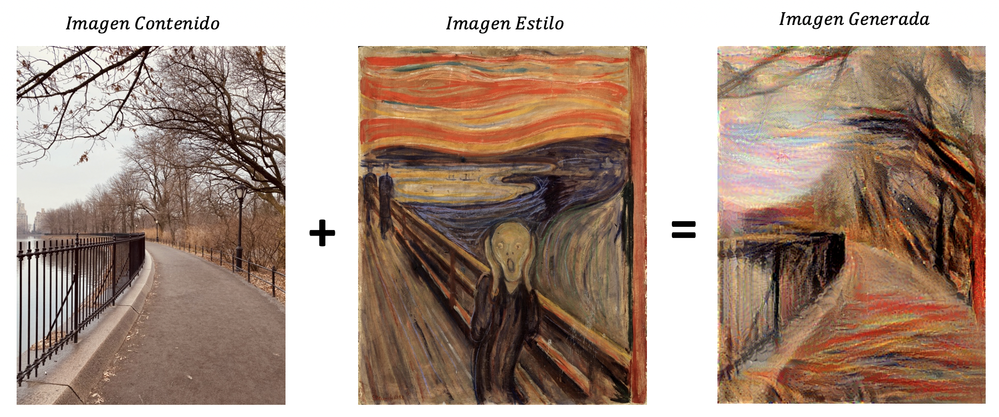